### Taking the best performing of BRCA dataset and applying our findings to PPMI transcripts data

In [1]:
import sys
import importlib
import pickle

# data manipulation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# data analysis
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

# pytorch specific
import torch
import torch.optim as optim
import torch.nn.functional as F
from tqdm import tqdm

# project specific
sys.path.append('../')
from src import config
from src.utils import visualisation, benchmark, helpers, monitoring, experiment
from src.models import model


from matplotlib.animation import FuncAnimation
from IPython.display import HTML

pd.options.display.width = 1000
DEVICE = torch.device(config["DEVICE"])

input shape : 3242
(1231, 3242)
(1231, 1, 3242)
train data: 1231
Running the following configuration:
../workfiles/light_BRCA_ds.pkl
{'convolution': True, 'dropout': 0.3, 'latent_dim': 16, 'padding': 3, 'kernel_size': 7, 'num_layers': 3}


/opt/homebrew/anaconda3/envs/thesis/lib/python3.9/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '
  2%|▏         | 9/500 [00:47<41:56,  5.13s/it]

Silhouette score for 5 clusters: 0.37090495228767395


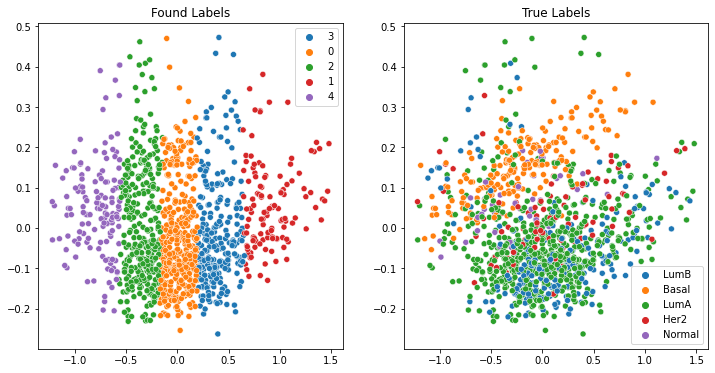

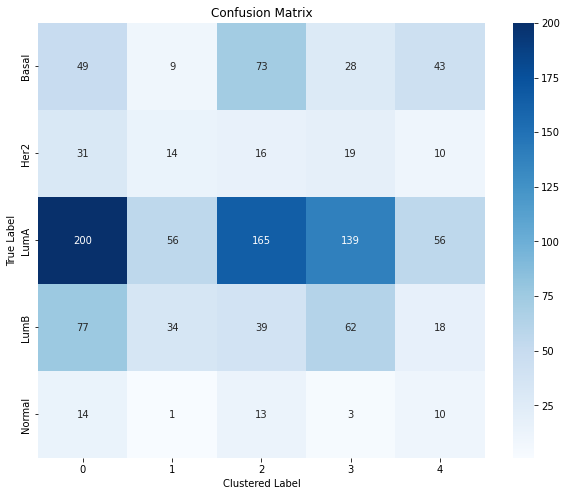

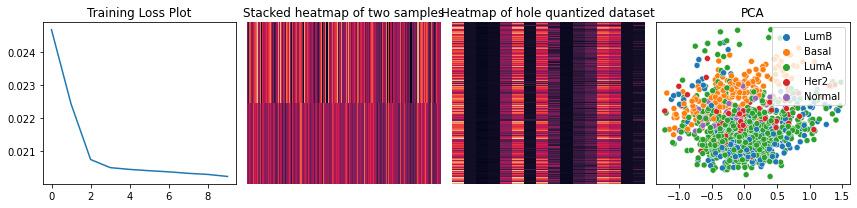

  2%|▏         | 10/500 [00:56<52:30,  6.43s/it]

HOPKINS STATISTIC 0.9563399079082936
Silhouette score for 5 clusters: 0.323004812002182


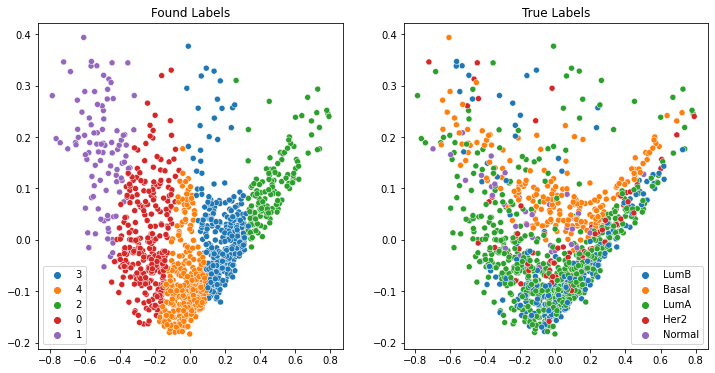

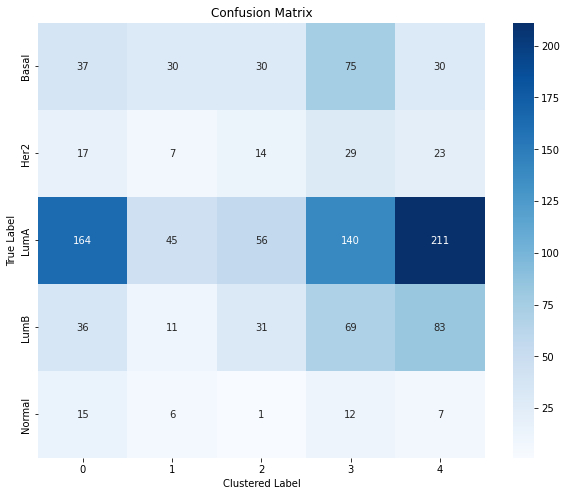

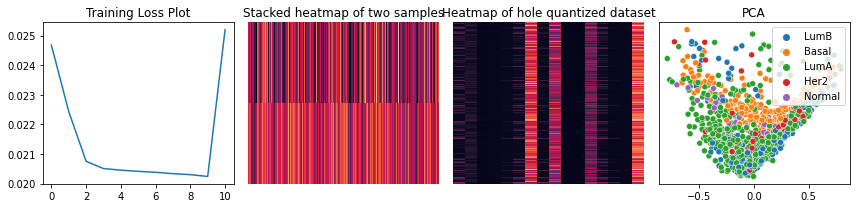

  2%|▏         | 11/500 [01:09<1:08:34,  8.41s/it]

HOPKINS STATISTIC 0.9371098103245697


  2%|▏         | 12/500 [01:14<1:01:09,  7.52s/it]

Silhouette score for 5 clusters: 0.34444886445999146


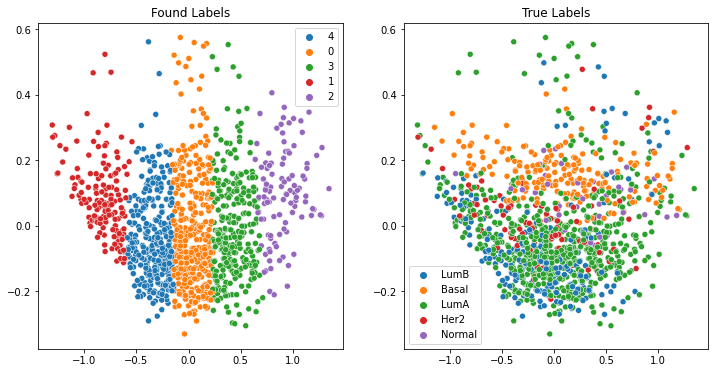

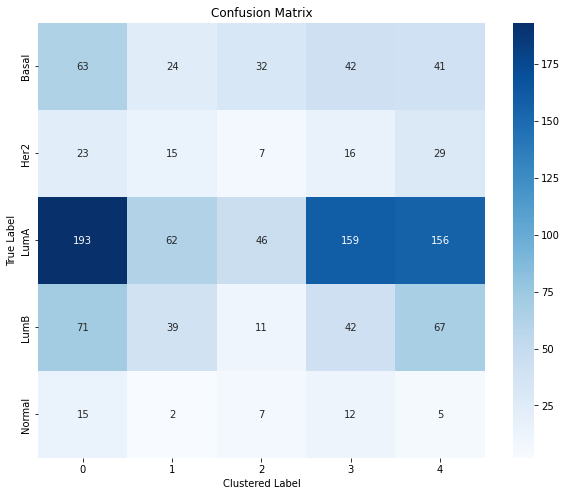

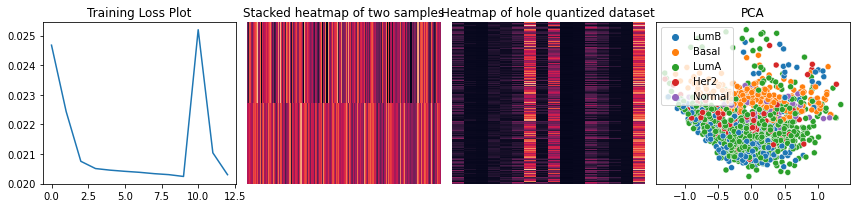

  3%|▎         | 13/500 [01:25<1:08:55,  8.49s/it]

HOPKINS STATISTIC 0.9394972905452678


  3%|▎         | 14/500 [01:30<1:00:37,  7.49s/it]

Silhouette score for 5 clusters: 0.33966749906539917


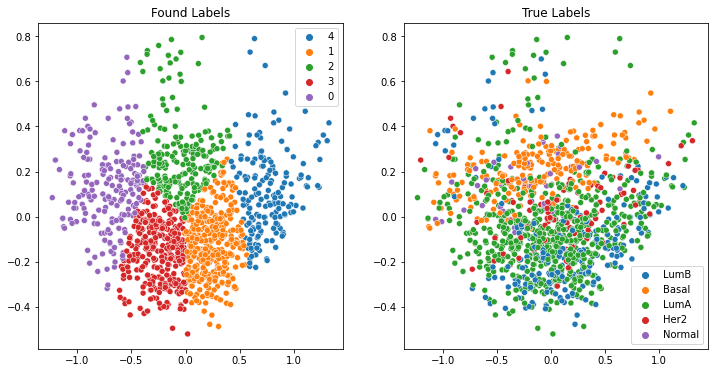

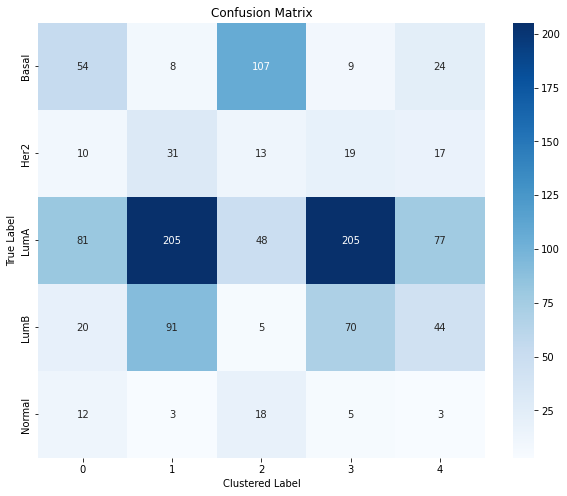

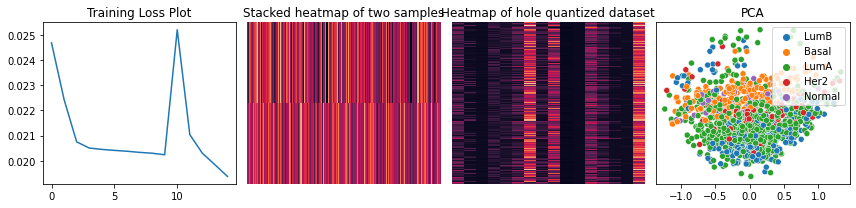

  3%|▎         | 15/500 [01:42<1:10:51,  8.77s/it]

HOPKINS STATISTIC 0.9270373207170113


  3%|▎         | 16/500 [01:47<1:01:53,  7.67s/it]

Silhouette score for 5 clusters: 0.28715983033180237


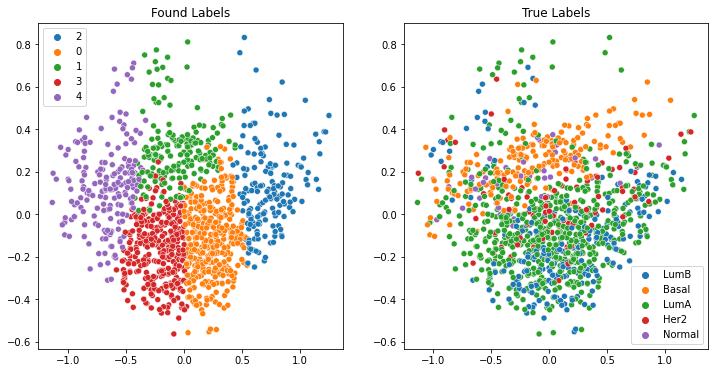

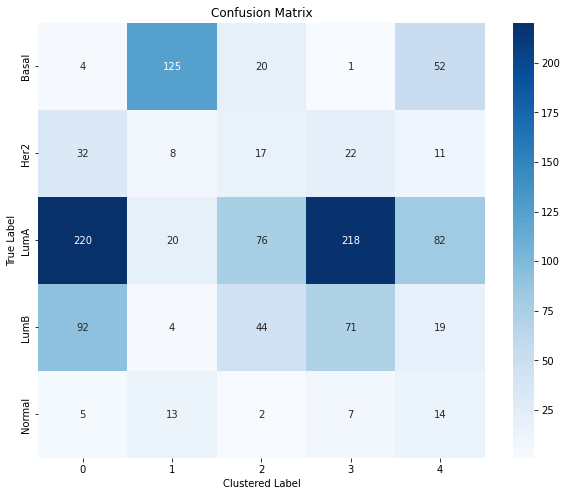

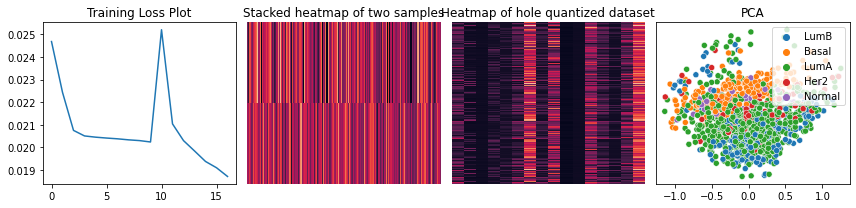

  3%|▎         | 17/500 [01:56<1:05:21,  8.12s/it]

HOPKINS STATISTIC 0.908353539581106


  4%|▍         | 19/500 [02:07<54:45,  6.83s/it]  

Silhouette score for 5 clusters: 0.2742459774017334


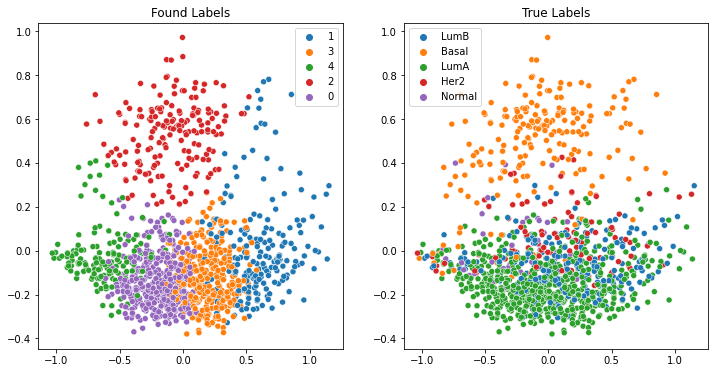

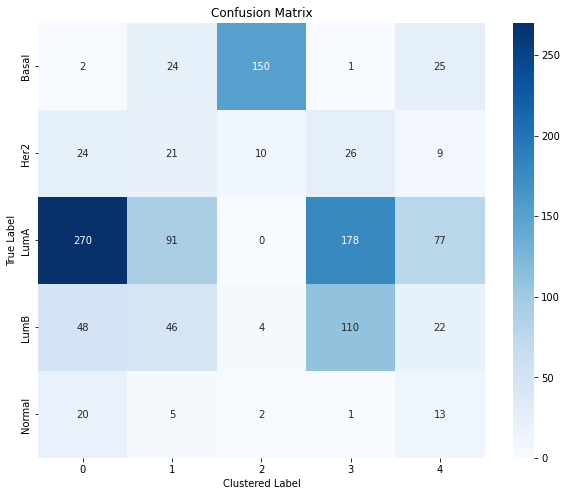

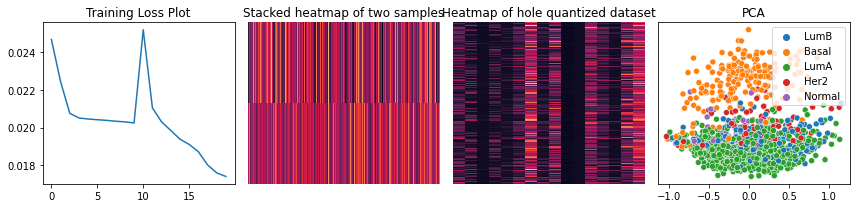

  4%|▍         | 20/500 [02:18<1:02:46,  7.85s/it]

HOPKINS STATISTIC 0.8900425252086238


  4%|▍         | 22/500 [02:28<51:30,  6.47s/it]  

Silhouette score for 5 clusters: 0.2757306694984436


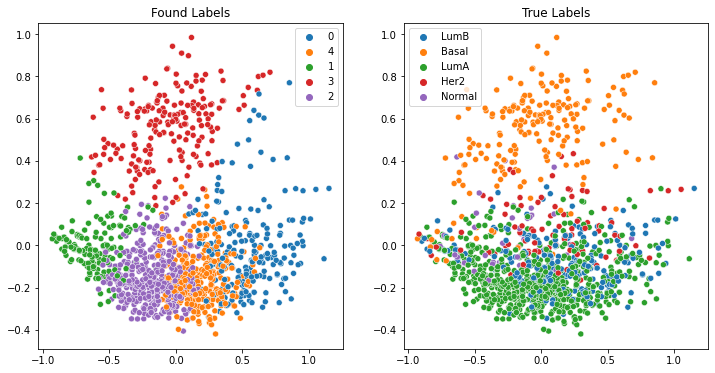

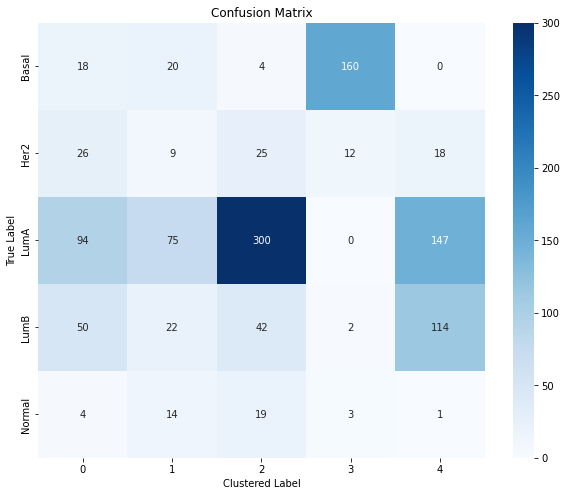

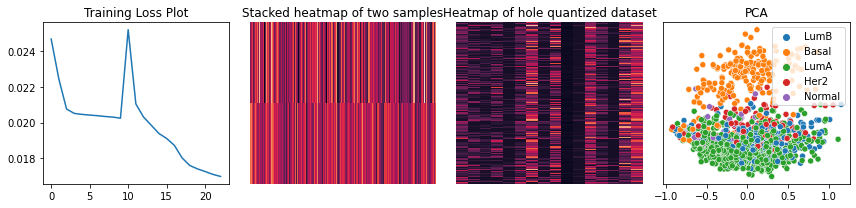

  5%|▍         | 23/500 [02:38<59:43,  7.51s/it]

HOPKINS STATISTIC 0.8818444049982173


  5%|▌         | 25/500 [02:48<49:31,  6.26s/it]

Silhouette score for 5 clusters: 0.25977823138237


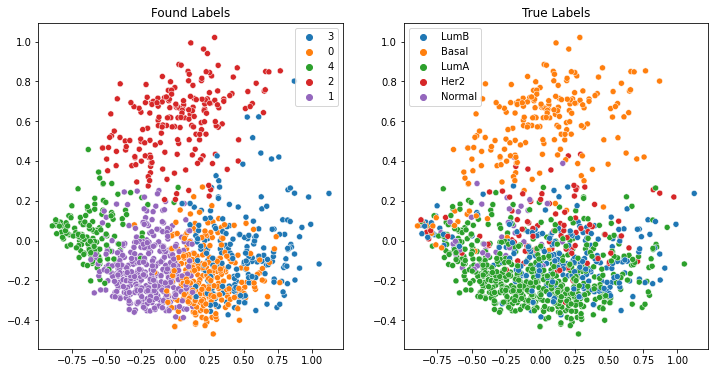

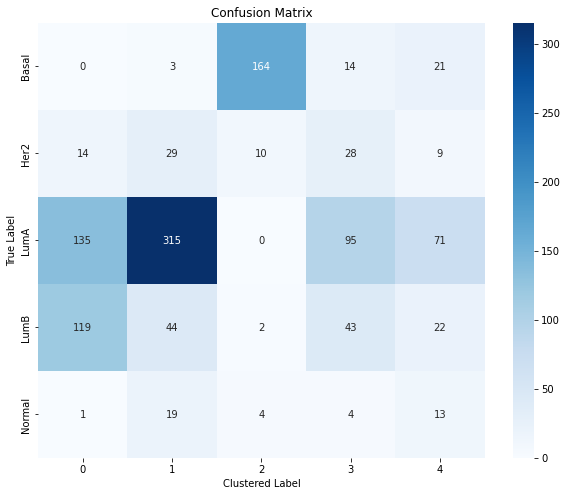

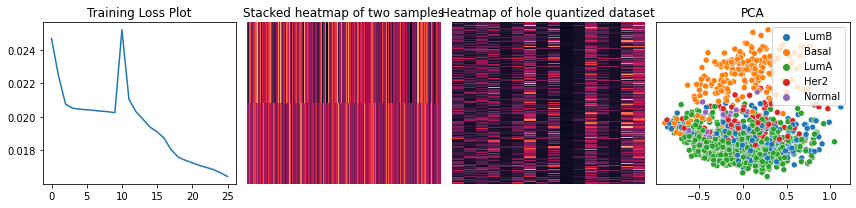

  5%|▌         | 26/500 [02:57<56:22,  7.14s/it]

HOPKINS STATISTIC 0.8679864641582556


  6%|▌         | 29/500 [03:12<44:48,  5.71s/it]

Silhouette score for 5 clusters: 0.2665393352508545


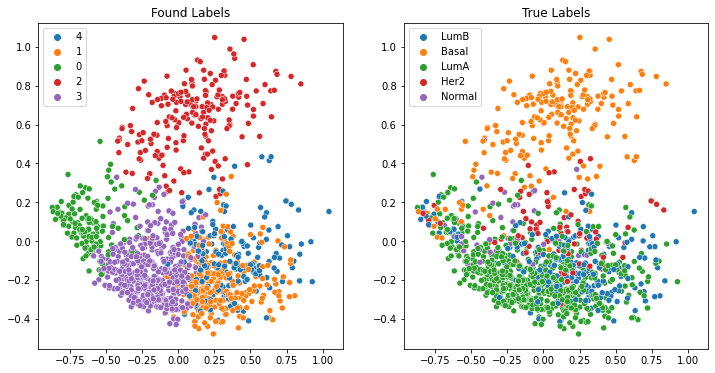

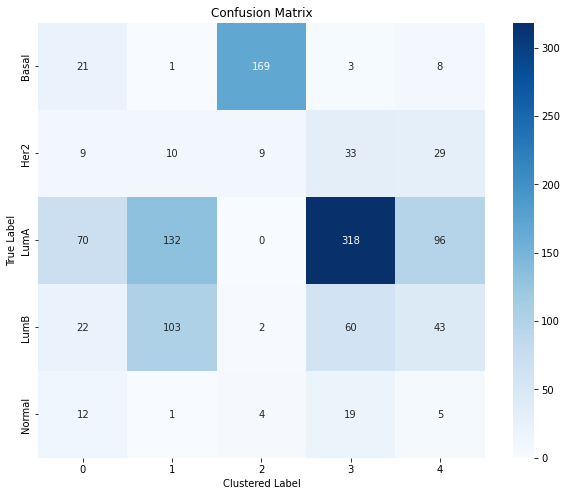

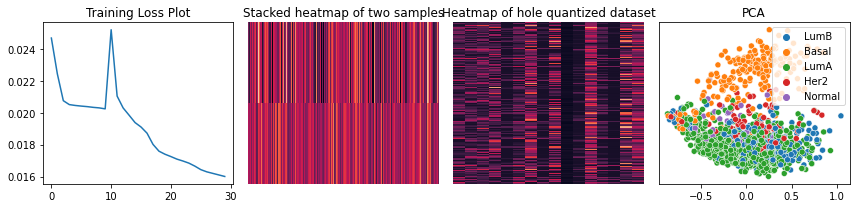

  6%|▌         | 30/500 [03:21<52:50,  6.75s/it]

HOPKINS STATISTIC 0.8622516599310963


  7%|▋         | 34/500 [03:41<41:27,  5.34s/it]

Silhouette score for 5 clusters: 0.2583886981010437


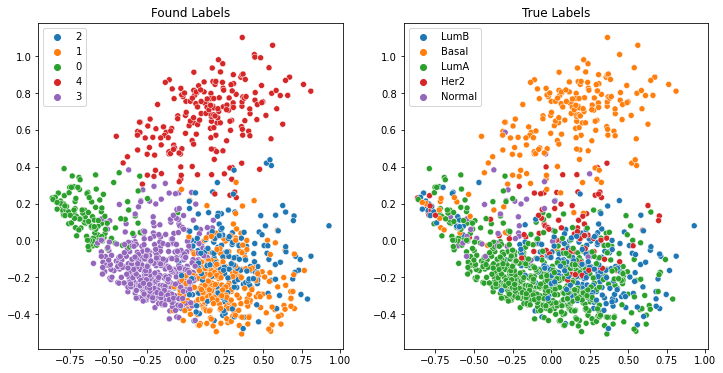

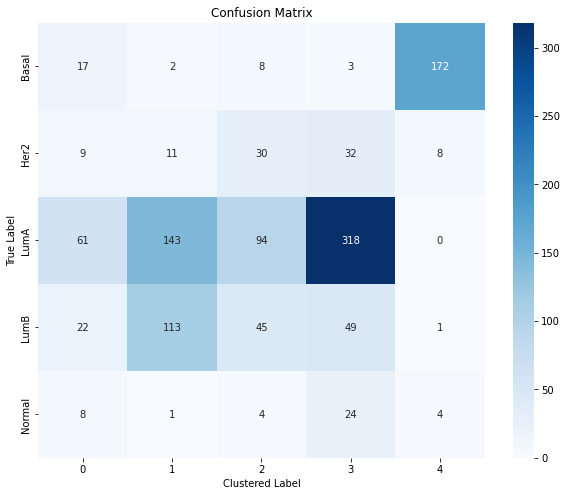

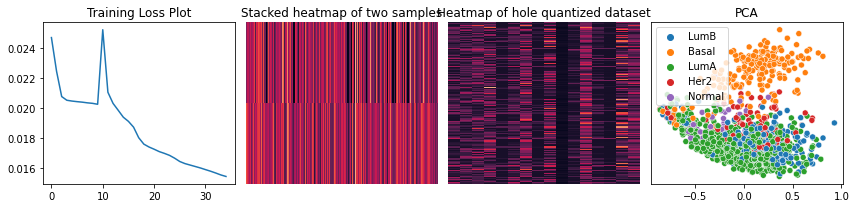

  7%|▋         | 35/500 [03:50<50:39,  6.54s/it]

HOPKINS STATISTIC 0.8529227400291877


  8%|▊         | 39/500 [04:10<40:31,  5.27s/it]

Silhouette score for 5 clusters: 0.2377440631389618


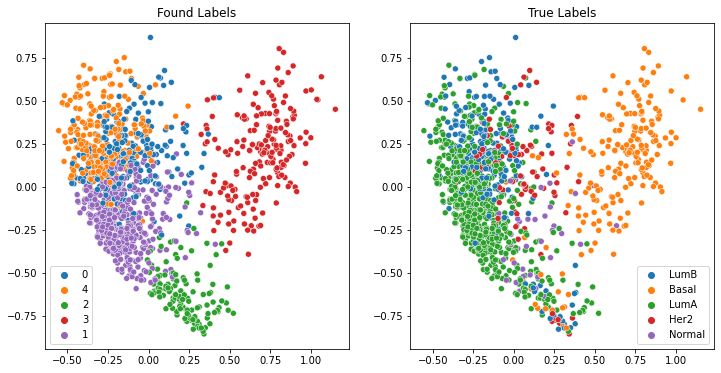

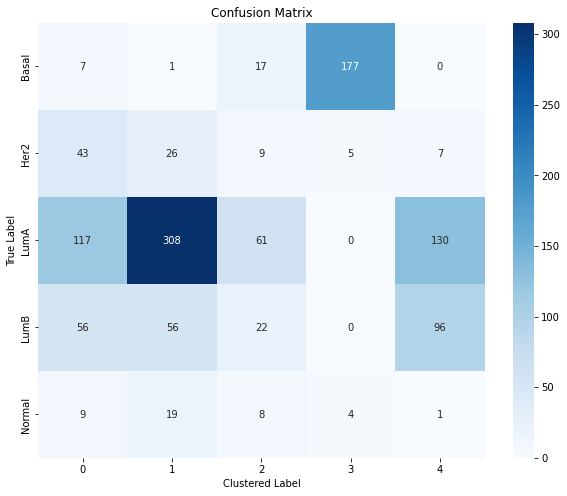

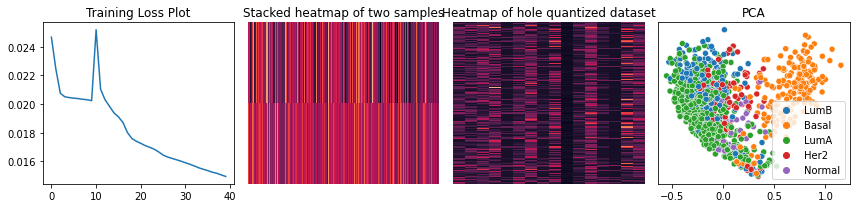

  8%|▊         | 40/500 [04:19<49:02,  6.40s/it]

HOPKINS STATISTIC 0.8380553233034251


  9%|▉         | 46/500 [04:48<38:27,  5.08s/it]

Silhouette score for 5 clusters: 0.21954256296157837


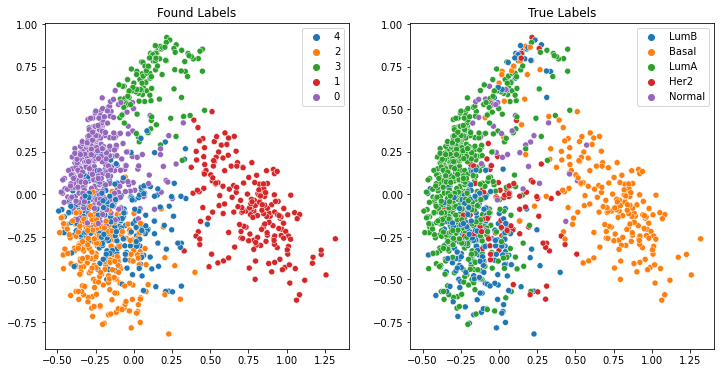

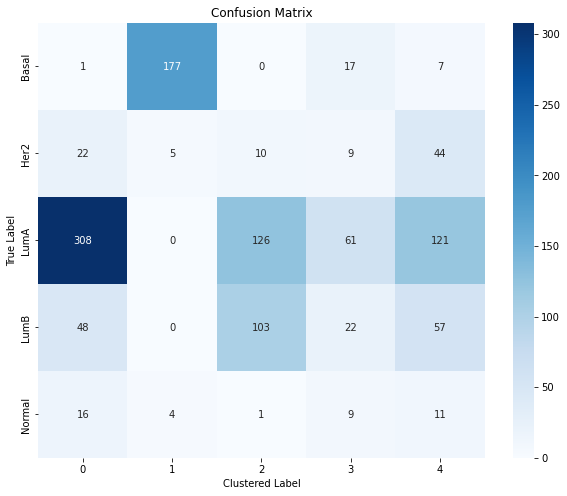

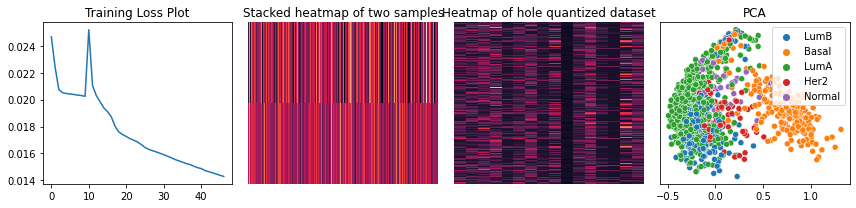

  9%|▉         | 47/500 [04:57<47:20,  6.27s/it]

HOPKINS STATISTIC 0.8209067894771942


 11%|█         | 53/500 [05:27<37:33,  5.04s/it]

Silhouette score for 5 clusters: 0.2122763991355896


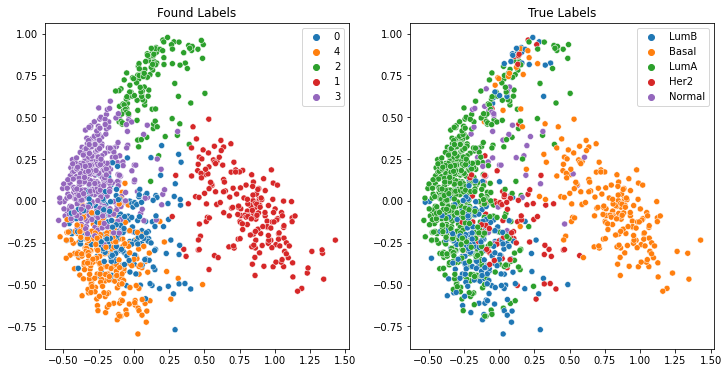

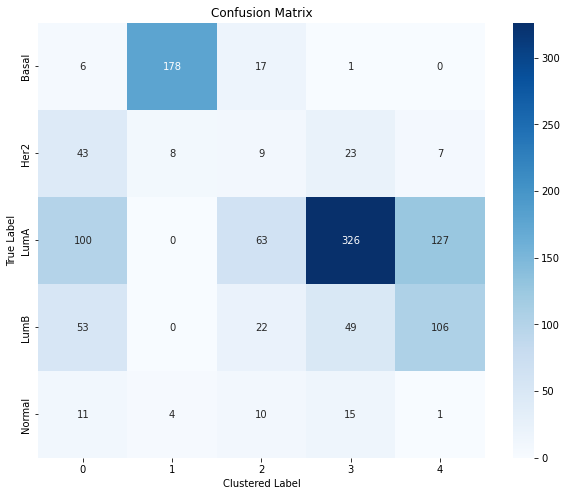

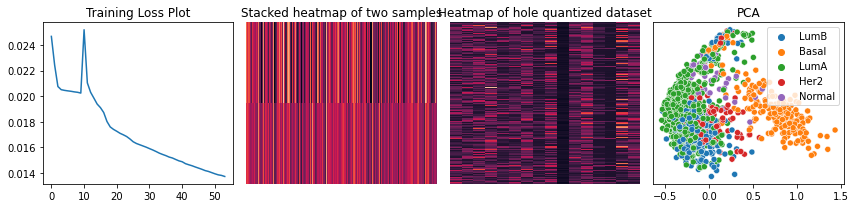

 11%|█         | 54/500 [05:36<46:14,  6.22s/it]

HOPKINS STATISTIC 0.8082288049236159


 12%|█▏        | 61/500 [06:10<36:30,  4.99s/it]

Silhouette score for 5 clusters: 0.1911701261997223


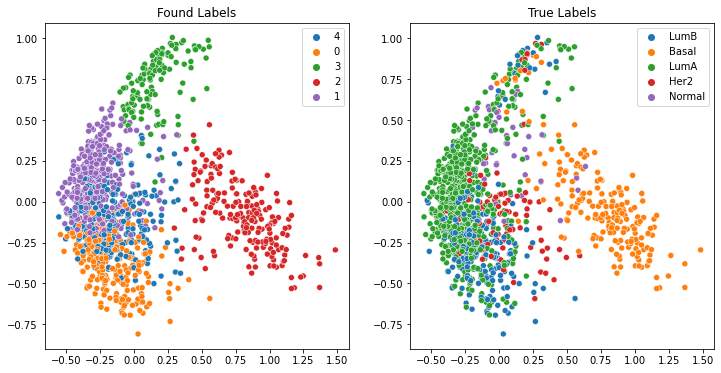

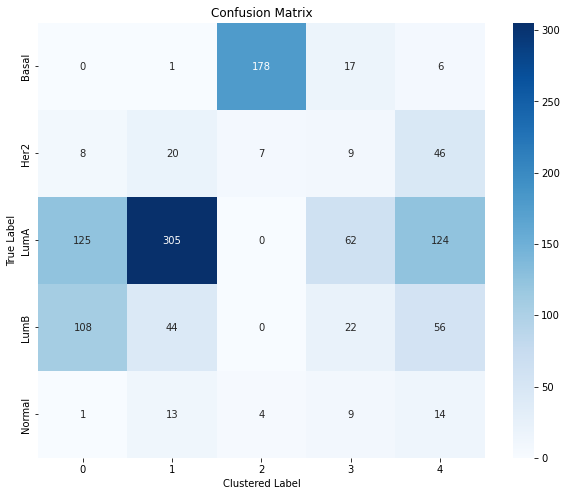

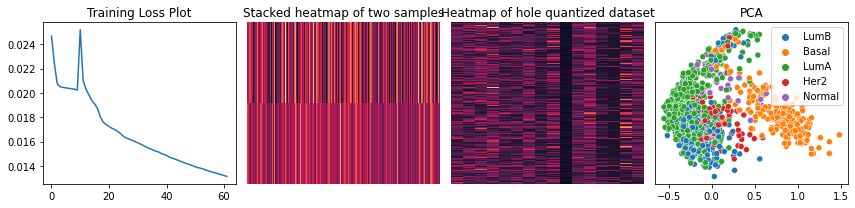

 12%|█▏        | 62/500 [06:19<45:50,  6.28s/it]

HOPKINS STATISTIC 0.7943090909789902


 14%|█▍        | 70/500 [06:59<36:19,  5.07s/it]

Silhouette score for 5 clusters: 0.1814022660255432


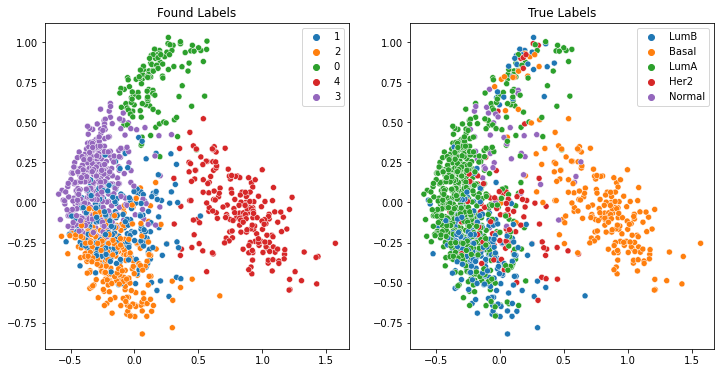

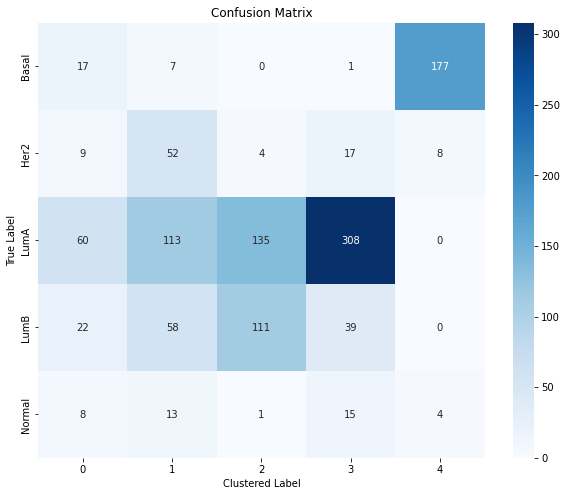

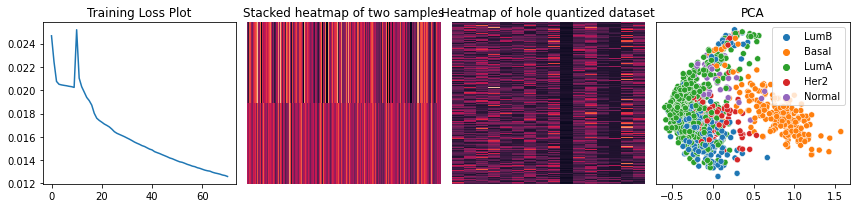

 14%|█▍        | 71/500 [07:08<45:24,  6.35s/it]

HOPKINS STATISTIC 0.7826033715690263


 16%|█▌        | 81/500 [07:59<35:37,  5.10s/it]

Silhouette score for 5 clusters: 0.16199754178524017


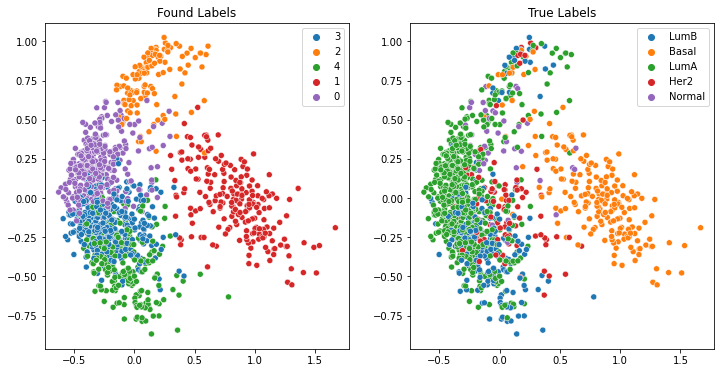

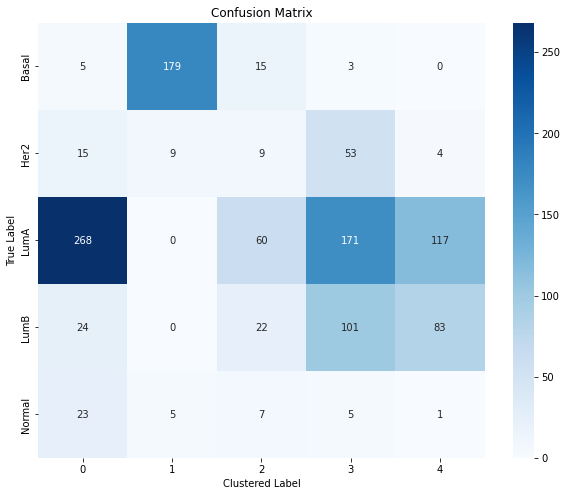

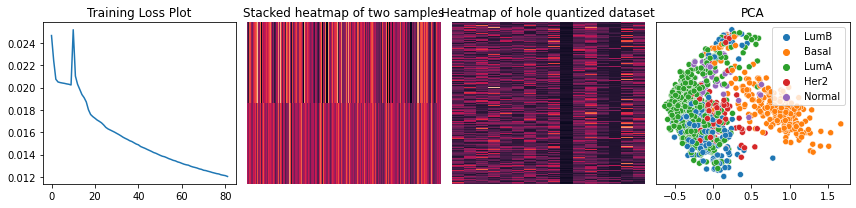

 16%|█▋        | 82/500 [08:08<45:09,  6.48s/it]

HOPKINS STATISTIC 0.7711879701940426


 19%|█▉        | 94/500 [09:09<33:39,  4.97s/it]

Silhouette score for 5 clusters: 0.1695709079504013


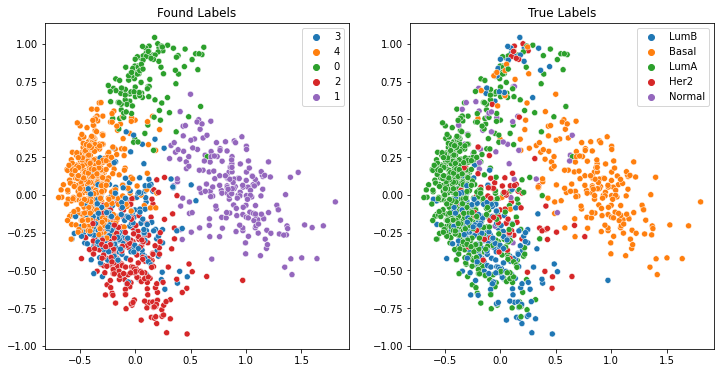

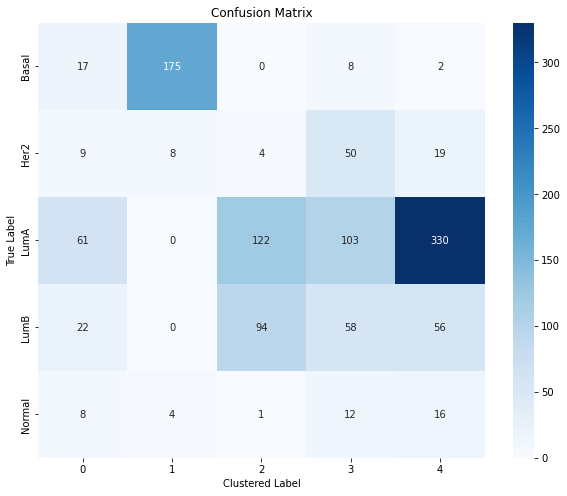

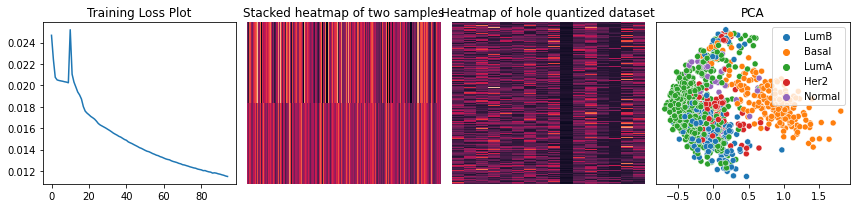

 19%|█▉        | 95/500 [09:18<42:17,  6.27s/it]

HOPKINS STATISTIC 0.7673644410639588


 22%|██▏       | 108/500 [10:22<32:07,  4.92s/it]

Silhouette score for 5 clusters: 0.15248344838619232


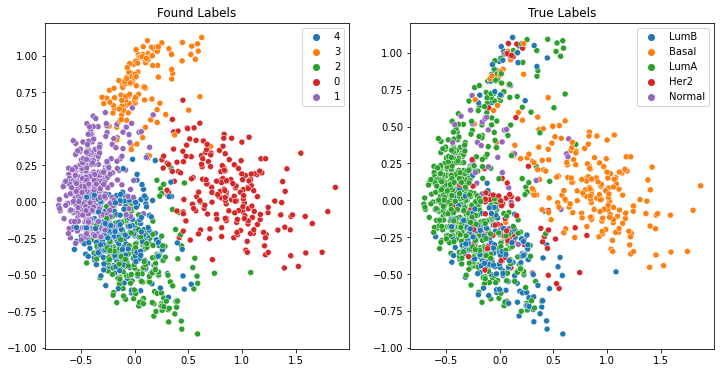

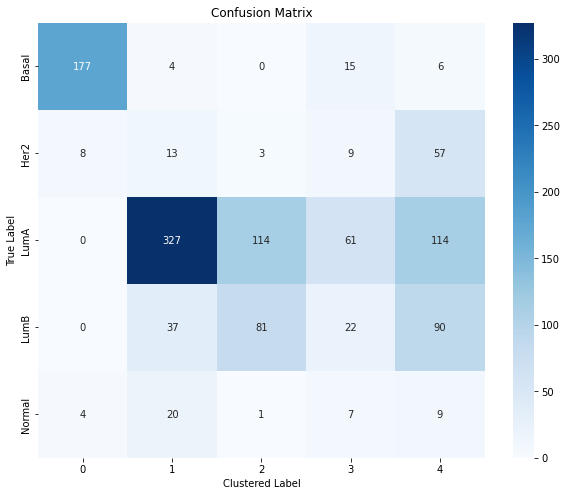

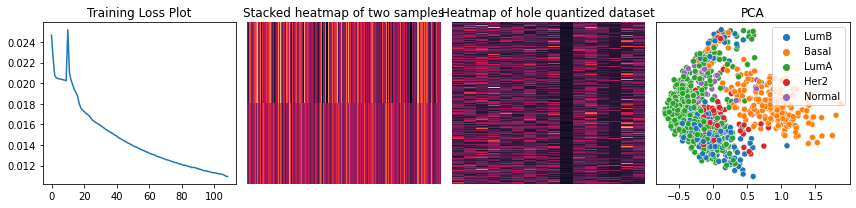

 22%|██▏       | 109/500 [10:31<40:08,  6.16s/it]

HOPKINS STATISTIC 0.7634566747297651


 25%|██▌       | 125/500 [11:50<30:53,  4.94s/it]

Silhouette score for 5 clusters: 0.16132855415344238


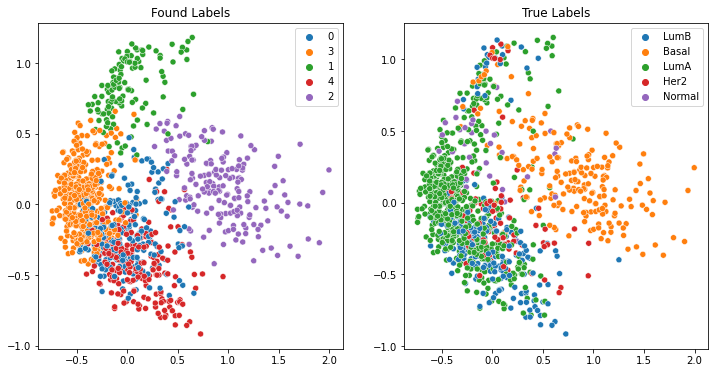

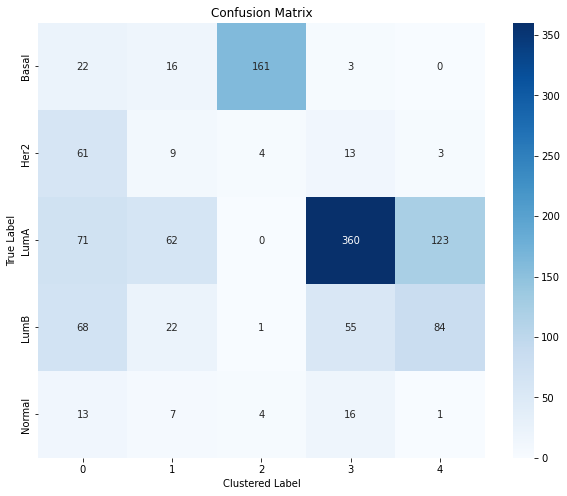

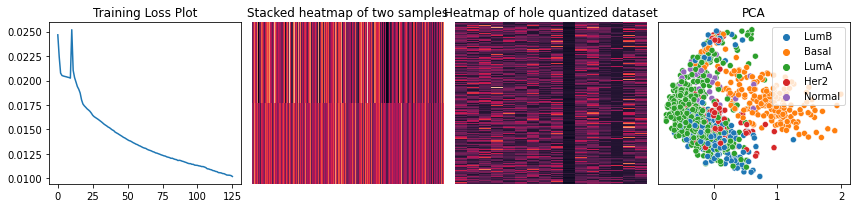

 25%|██▌       | 126/500 [11:59<39:13,  6.29s/it]

HOPKINS STATISTIC 0.7607306309104795


 29%|██▉       | 144/500 [13:28<29:19,  4.94s/it]

Silhouette score for 5 clusters: 0.14546921849250793


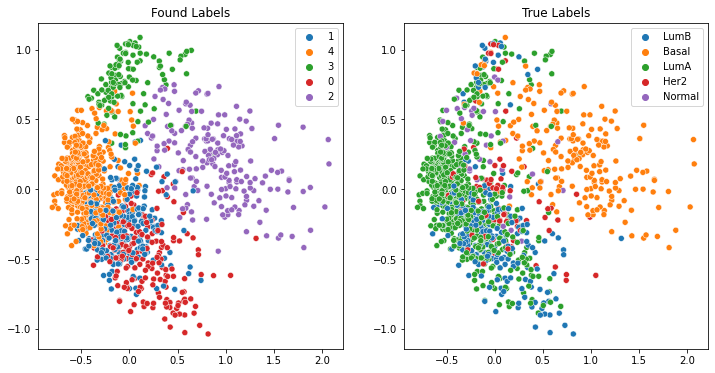

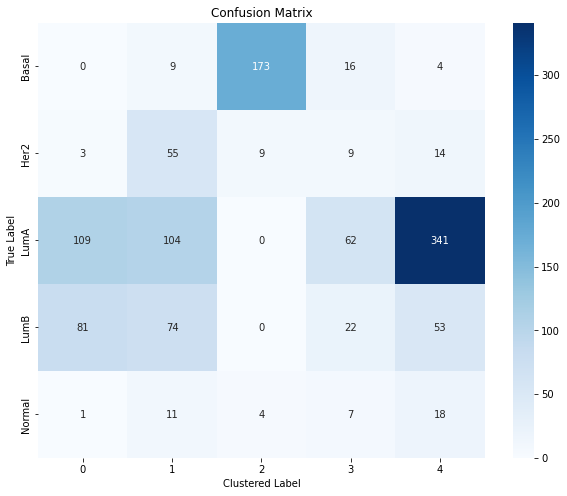

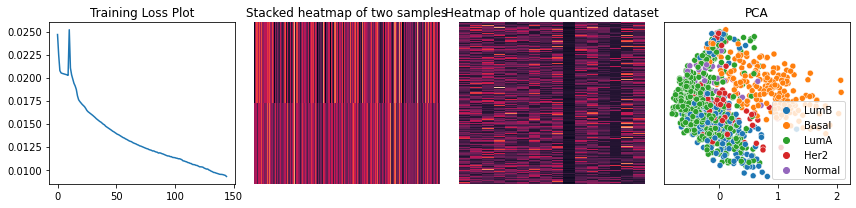

 29%|██▉       | 145/500 [13:37<36:45,  6.21s/it]

HOPKINS STATISTIC 0.7541402866211959


 33%|███▎      | 166/500 [15:22<27:43,  4.98s/it]

Silhouette score for 5 clusters: 0.15642891824245453


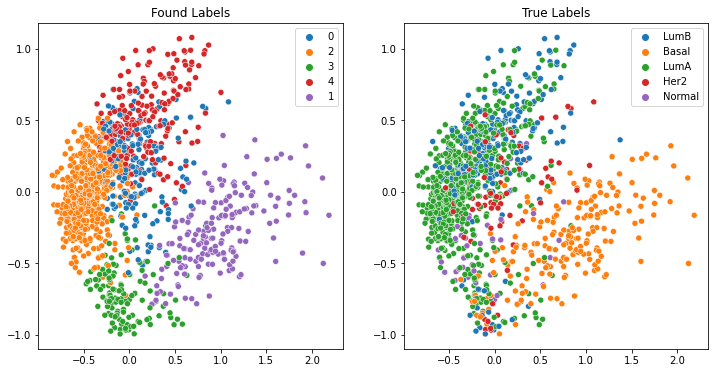

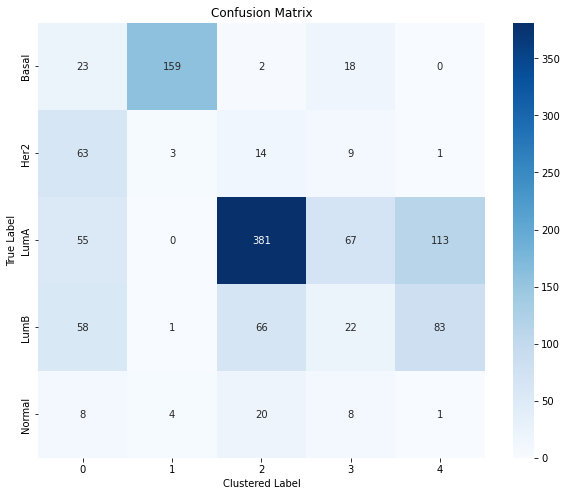

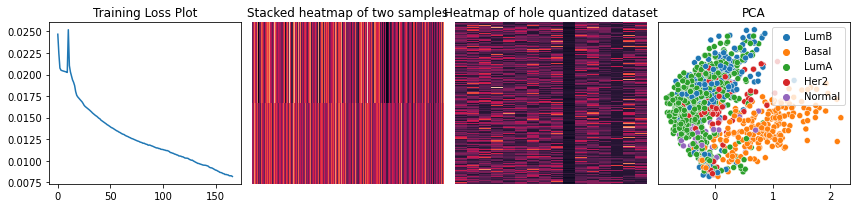

 33%|███▎      | 167/500 [15:31<34:43,  6.26s/it]

HOPKINS STATISTIC 0.7519555106548624


 38%|███▊      | 192/500 [17:36<25:31,  4.97s/it]

Silhouette score for 5 clusters: 0.1529594212770462


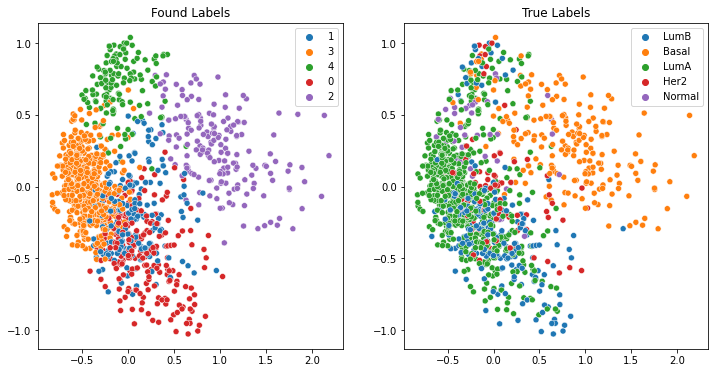

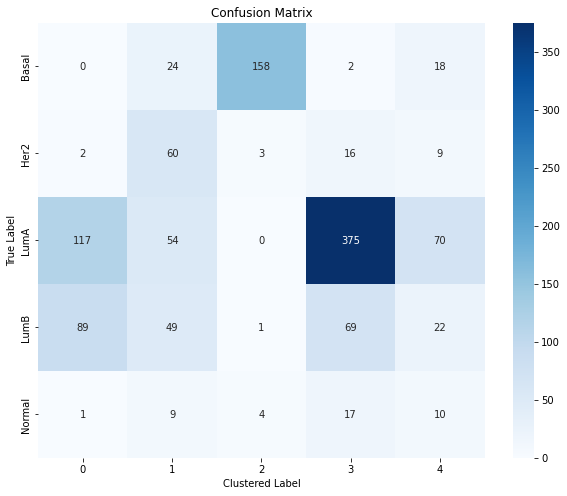

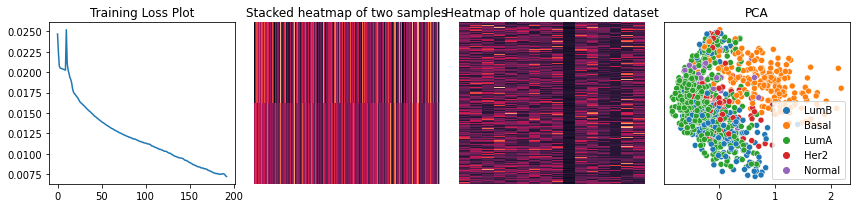

 39%|███▊      | 193/500 [17:46<32:07,  6.28s/it]

HOPKINS STATISTIC 0.744528701925227


 44%|████▍     | 221/500 [20:06<23:45,  5.11s/it]

Silhouette score for 5 clusters: 0.13782605528831482


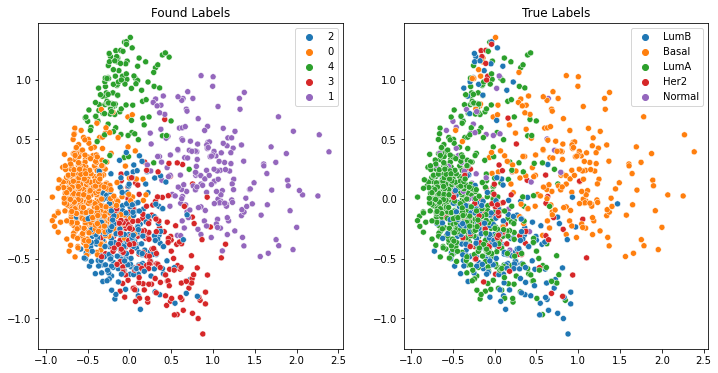

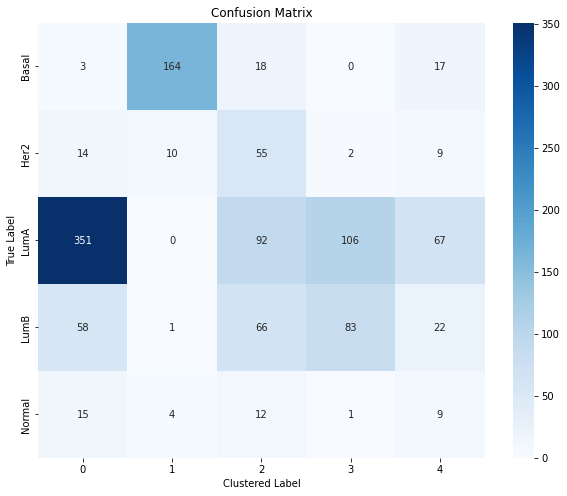

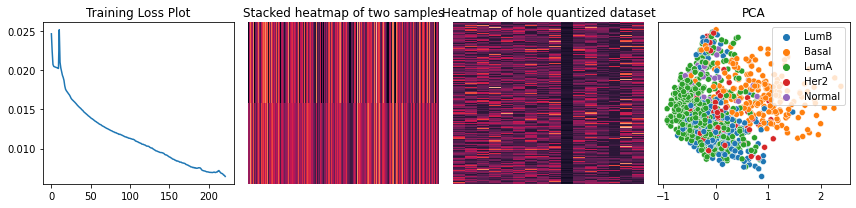

 44%|████▍     | 222/500 [20:16<30:49,  6.65s/it]

HOPKINS STATISTIC 0.737619392462032


 51%|█████     | 254/500 [22:54<20:36,  5.02s/it]

Silhouette score for 5 clusters: 0.130149245262146


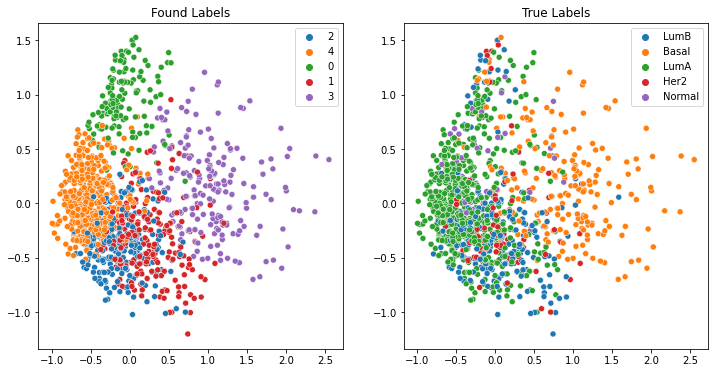

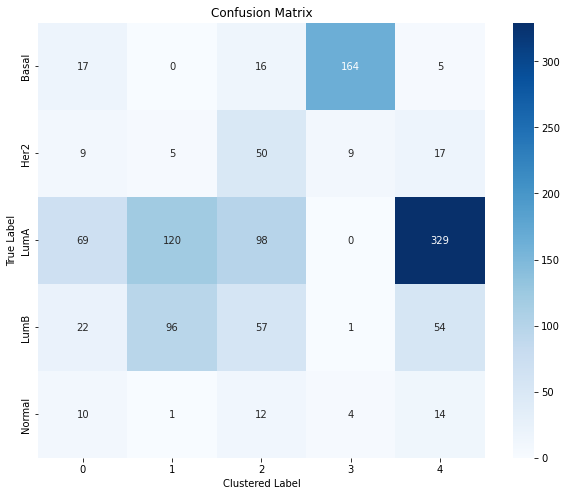

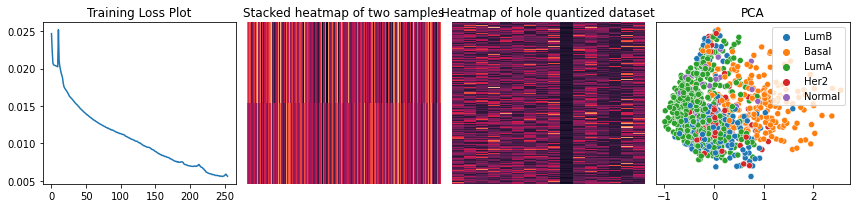

 51%|█████     | 255/500 [23:04<26:35,  6.51s/it]

HOPKINS STATISTIC 0.7334723087362395


 59%|█████▊    | 293/500 [26:27<20:43,  6.01s/it]

Silhouette score for 5 clusters: 0.13652607798576355


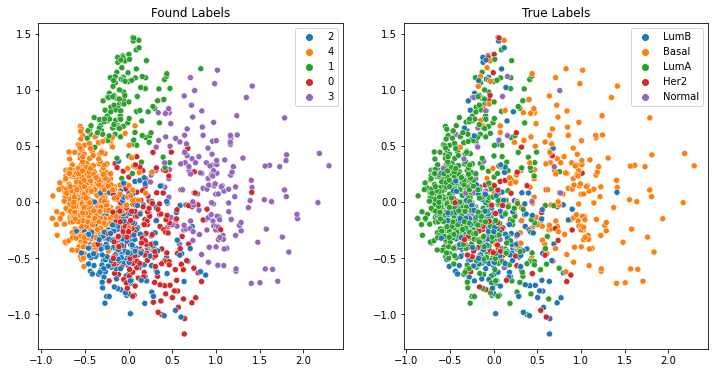

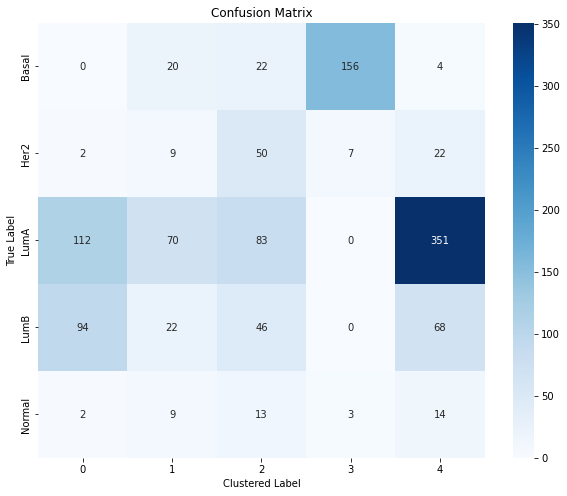

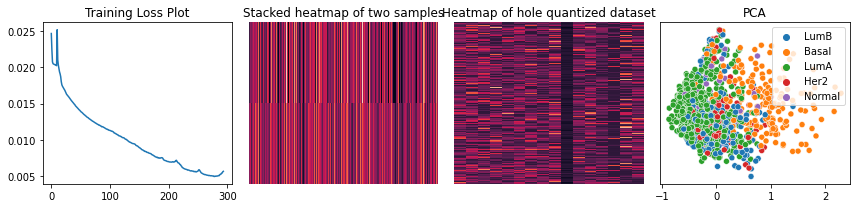

 59%|█████▉    | 294/500 [26:51<39:33, 11.52s/it]

HOPKINS STATISTIC 0.7392615203614481


 68%|██████▊   | 338/500 [33:13<17:49,  6.60s/it]  

Silhouette score for 5 clusters: 0.13230787217617035


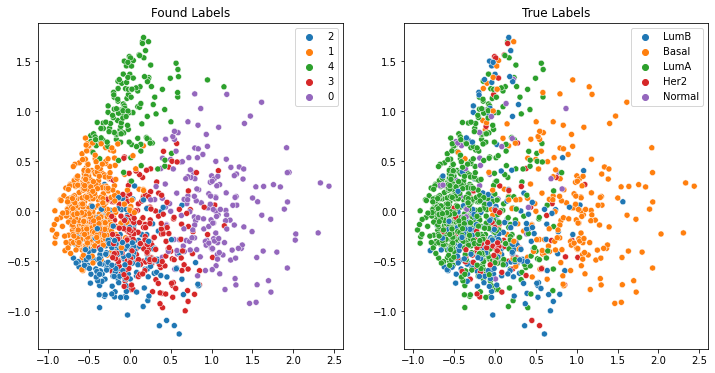

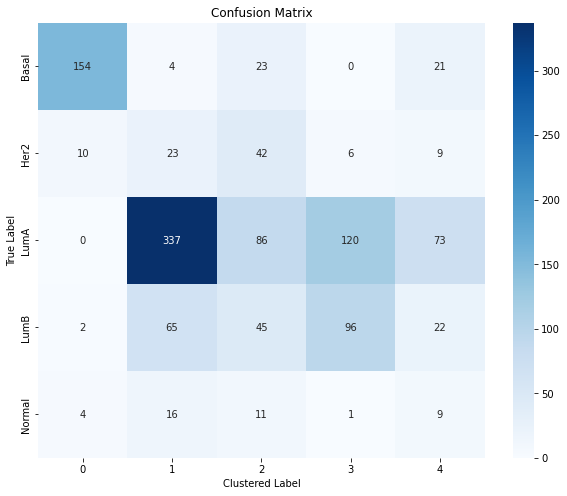

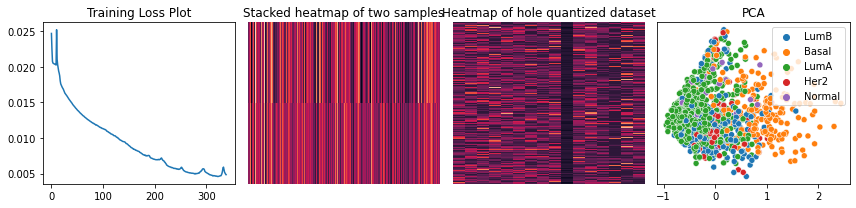

 68%|██████▊   | 339/500 [33:26<23:23,  8.72s/it]

HOPKINS STATISTIC 0.7375665101489275


 78%|███████▊  | 389/500 [38:51<11:02,  5.97s/it]

Silhouette score for 5 clusters: 0.12684300541877747


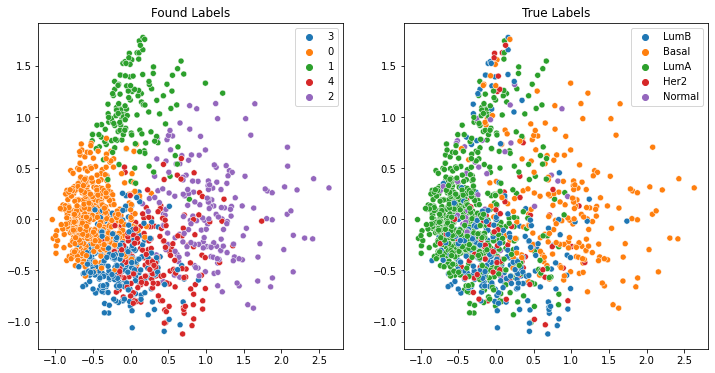

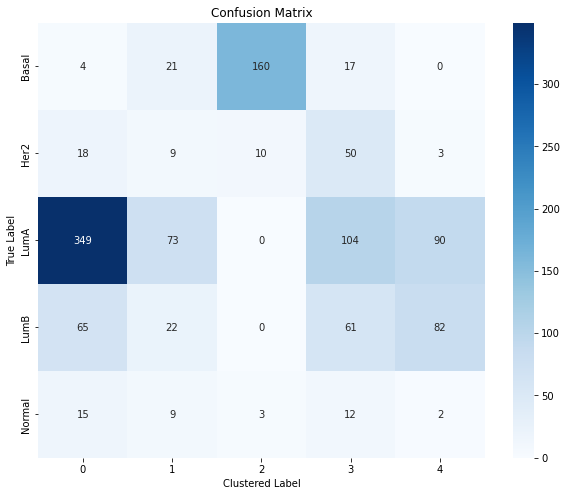

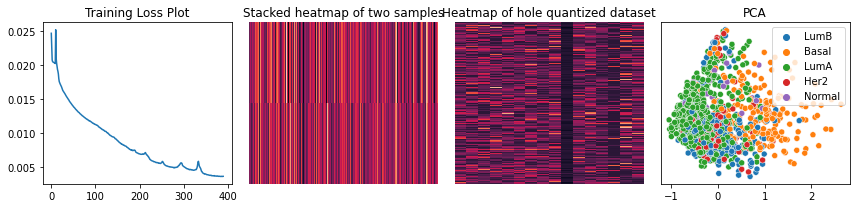

 78%|███████▊  | 390/500 [39:03<14:10,  7.73s/it]

HOPKINS STATISTIC 0.7335960733707689


 90%|████████▉ | 448/500 [44:19<04:21,  5.03s/it]

Silhouette score for 5 clusters: 0.12287239730358124


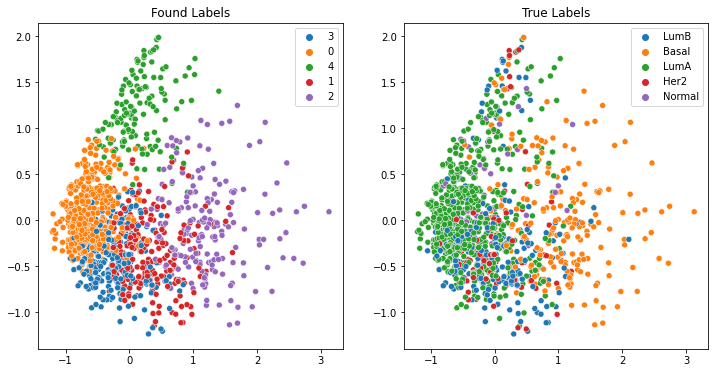

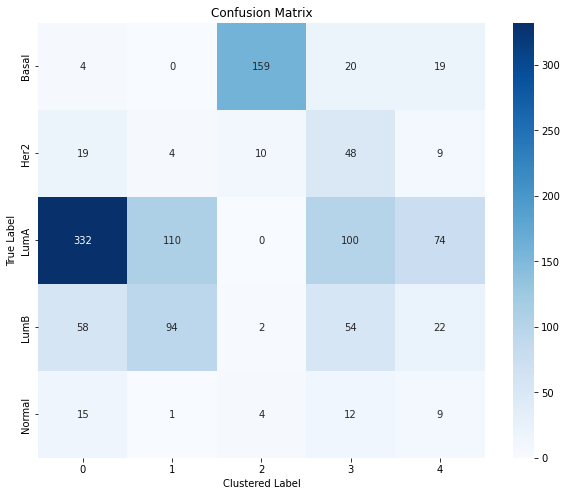

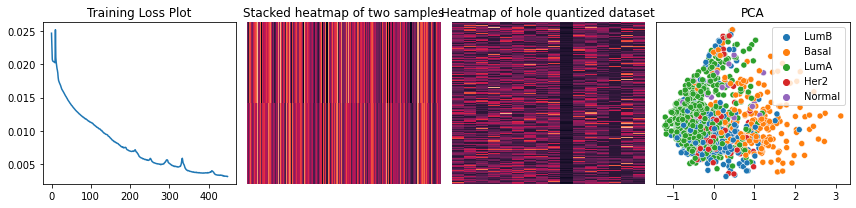

 90%|████████▉ | 449/500 [44:30<05:45,  6.78s/it]

HOPKINS STATISTIC 0.7270440870786995


100%|██████████| 500/500 [48:47<00:00,  5.85s/it]


Silhouette score for 5 clusters: 0.12502072751522064


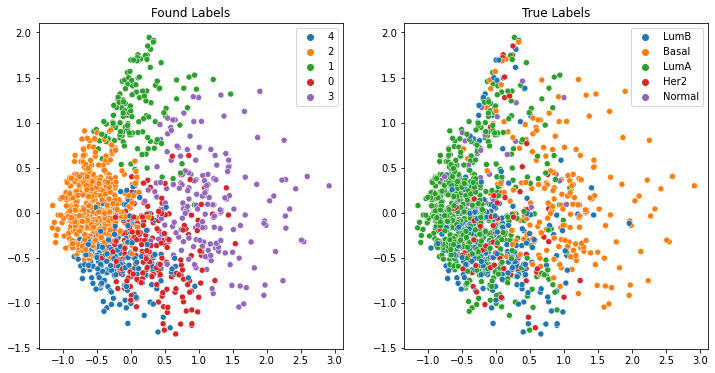

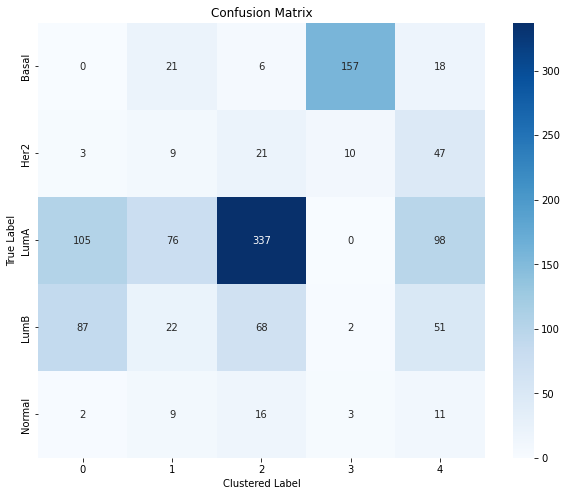

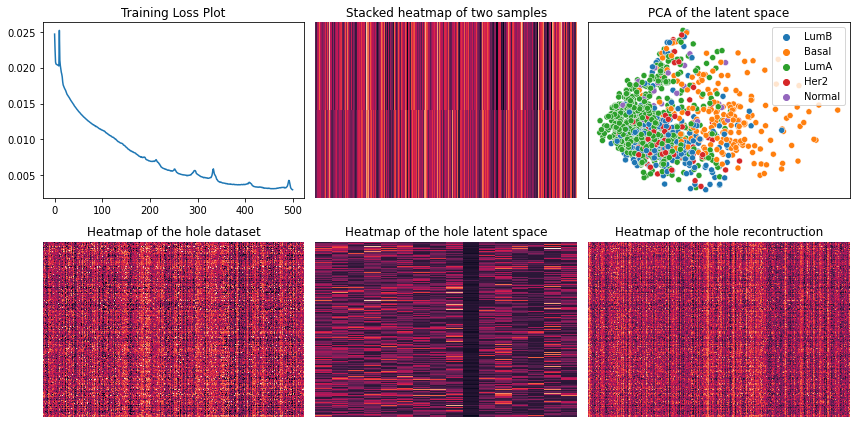

{'hopkins': 0.7282964605302051, 'ari': 0.2250448825236172, 'nmi': 0.2606355084590672, 'silhouette': 0.12502073, 'fm': 0.4535595290396804, 'homogeneity': 0.2852183534429635, 'completeness': 0.2399539800005487, 'v_measure': 0.2606355084590672}


In [2]:
best_performing_config = {'convolution': True, 
                          'dropout': 0.3, 
                          'latent_dim': 16, 
                          'padding': 3, 
                          'kernel_size': 7,
                          "num_layers" : 3,
                          "n_epoch" : 500}


data_param = "../workfiles/light_BRCA_ds.pkl"
# data_param = "../workfiles/PPMI_genes.pkl"
# data_param =  "../workfiles/PPMI_genes_PD_only.pkl"

e = experiment.Experiment(data_param, best_performing_config, verbose = 2 )



e.run()

In [ ]:
best_performing_config = {'convolution': True, 
                          'dropout': 0.3, 
                          'latent_dim': 16, 
                          'padding': 3, 
                          'kernel_size': 7,
                          "num_layers" : 3,
                          "n_epoch" : 100}


data_param = "../workfiles/light_BRCA_ds.pkl"
# data_param = "../workfiles/PPMI_genes.pkl"
# data_param =  "../workfiles/PPMI_genes_PD_only.pkl"

e_gain = experiment.Experiment(data_param, best_performing_config, verbose = 2)



e_gain.run()

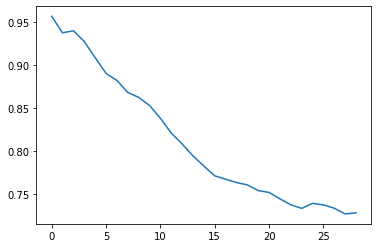

In [4]:
plt.plot([timepoint["hopkins"] for timepoint in e.monitor.metrics])


We litterally expect the opposite

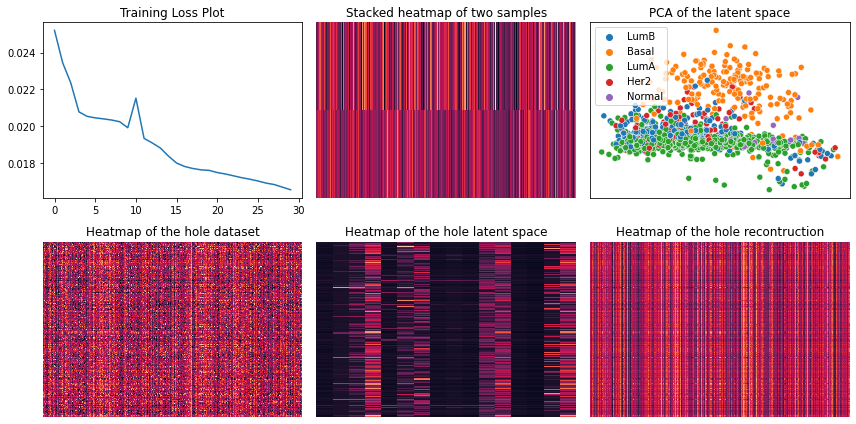

In [11]:
importlib.reload(visualisation)
visualisation.post_training_viz(e.data, e.dataloader, e.model, DEVICE, e.monitor.train_res_recon_error, labels = e.metadata["subtypes"])

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


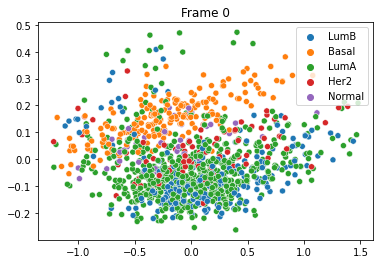

In [3]:
# Create a figure and axis for the animation
fig, ax = plt.subplots()

# Define an update function for the animation
def update(frame):
    ax.clear()
    ax.set_title(f'Frame {frame}')
    
    # Get the PCA result for the current frame
    pca_result = e.monitor.frames[frame]
    
    # Scatter plot of PCA results with color based on index
    sns.scatterplot(x=pca_result[:, 1], y=pca_result[:, 2], hue=e.metadata["subtypes"])


# Create the animation
ani = FuncAnimation(fig, update, frames=len(e.monitor.frames), repeat=True)

# Display the animation as HTML
HTML(ani.to_jshtml())

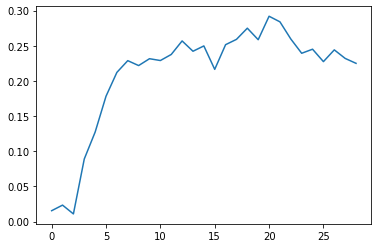

In [6]:
plt.plot([timepoint["ari"] for timepoint in e.monitor.metrics])


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


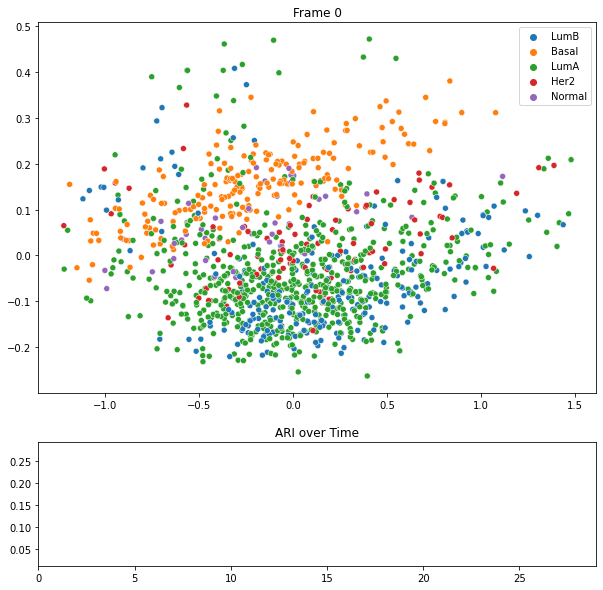

In [9]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import seaborn as sns

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1,figsize=(10, 10), gridspec_kw={'height_ratios': [3, 1]})

# Define an update function for the animation
def update(frame):
    ax1.clear()
    ax2.clear()

    # Update the scatter plot in the first subplot
    ax1.set_title(f'Frame {frame}')
    pca_result = e.monitor.frames[frame]
    sns.scatterplot(x=pca_result[:, 1], y=pca_result[:, 2], hue=e.metadata["subtypes"], ax=ax1)

    # Update the ARI curve in the second subplot
    ax2.plot([timepoint["ari"] for timepoint in e.monitor.metrics[:frame + 1]], color='blue')
    ax2.set_title('ARI over Time')
    ax2.set_xlim(0, len(e.monitor.metrics))
    ax2.set_ylim(min([tp["ari"] for tp in e.monitor.metrics]), max([tp["ari"] for tp in e.monitor.metrics]))

# Create the animation
ani = FuncAnimation(fig, update, frames=len(e.monitor.frames), repeat=True)

# Display the animation as HTML
HTML(ani.to_jshtml())


In [10]:
ani.save('animation.gif', writer='imagemagick', fps=20)  # fps can be adjusted as needed


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.PillowWriter'>


# now we use PPMI data

input shape : 11835
(1521, 11835)
(1521, 1, 11835)
train data: 1521


/opt/homebrew/anaconda3/envs/thesis/lib/python3.9/site-packages/torch/nn/modules/lazy.py:180: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


Running the following configuration:
../workfiles/PPMI_genes.pkl
{'variational': False, 'convolution': True, 'transformer': False, 'dropout': 0.3, 'latent_dim': 16, 'padding': 2, 'kernel_size': 5}


 30%|███       | 9/30 [03:20<07:25, 21.21s/it]

Silhouette score for 5 clusters: 0.3467080295085907


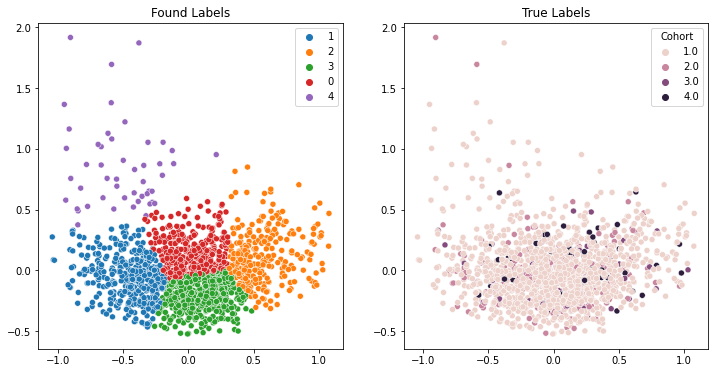

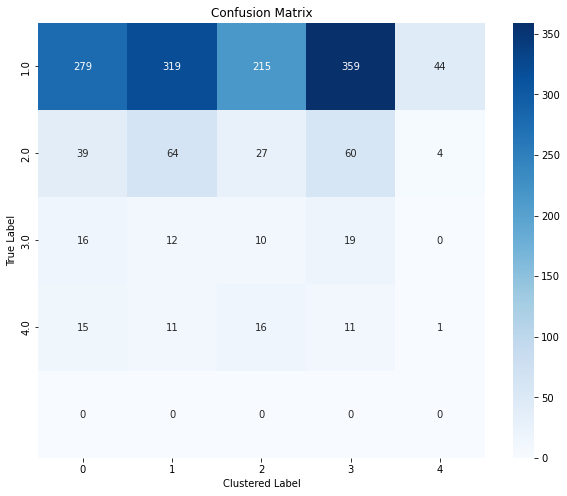

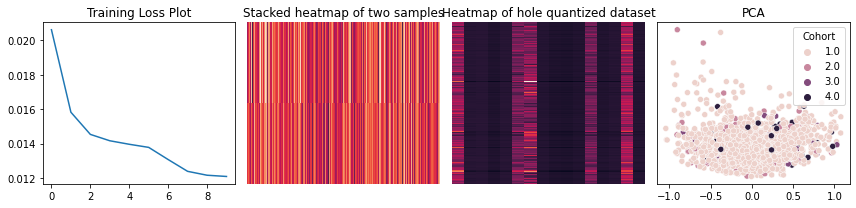

 33%|███▎      | 10/30 [03:43<07:20, 22.01s/it]

HOPKINS STATISTIC 0.9532204523960705
Silhouette score for 5 clusters: 0.42394784092903137


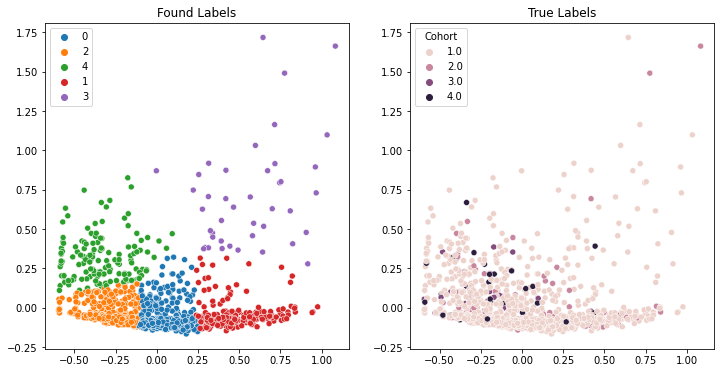

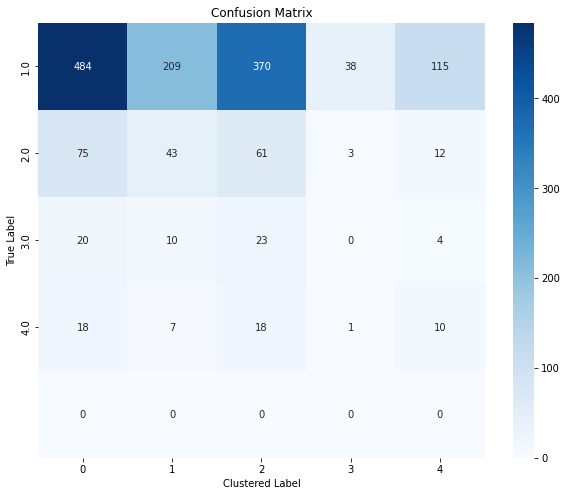

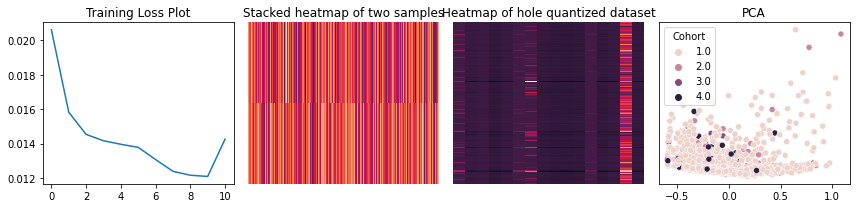

 37%|███▋      | 11/30 [09:06<36:03, 113.88s/it]

HOPKINS STATISTIC 0.9614326082321659


 40%|████      | 12/30 [11:09<35:04, 116.90s/it]

Silhouette score for 5 clusters: 0.33106958866119385


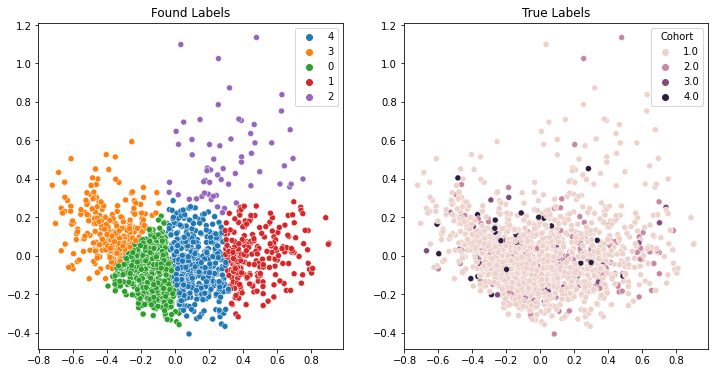

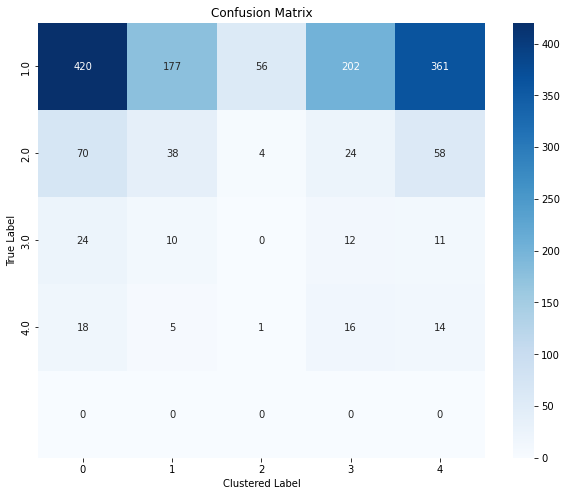

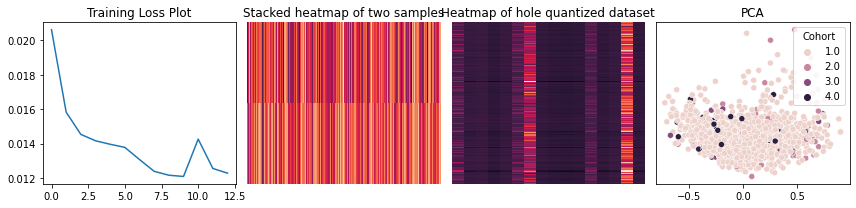

 43%|████▎     | 13/30 [21:37<1:16:57, 271.60s/it]

HOPKINS STATISTIC 0.9416764113177298


 47%|████▋     | 14/30 [33:27<1:47:43, 403.96s/it]

Silhouette score for 5 clusters: 0.3280302584171295


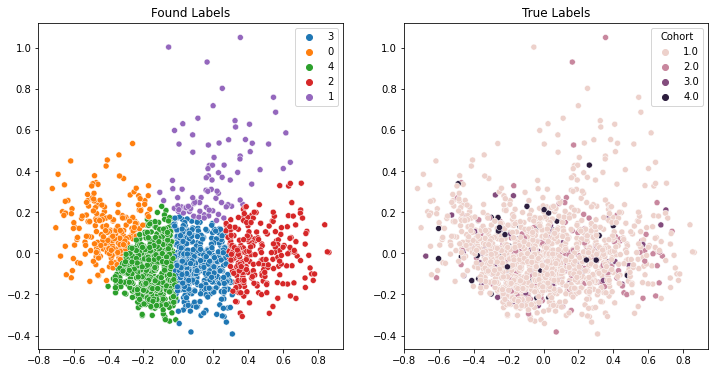

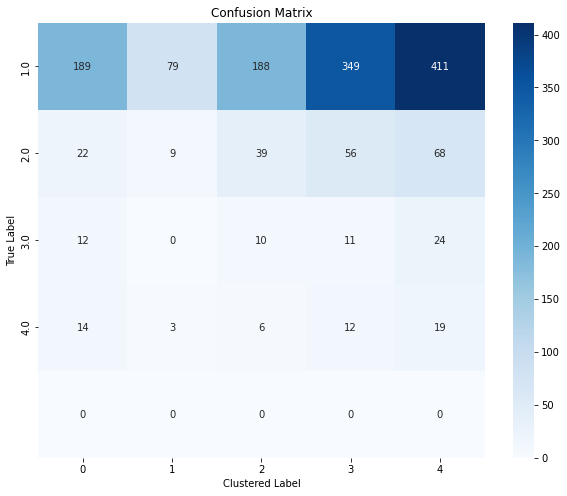

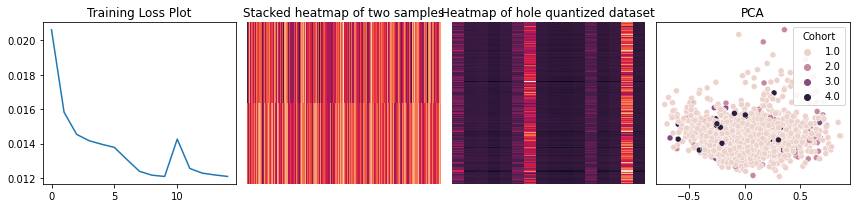

 50%|█████     | 15/30 [41:54<1:48:44, 435.00s/it]

HOPKINS STATISTIC 0.9365846868871349


 53%|█████▎    | 16/30 [48:12<1:37:30, 417.92s/it]

Silhouette score for 5 clusters: 0.3176475167274475


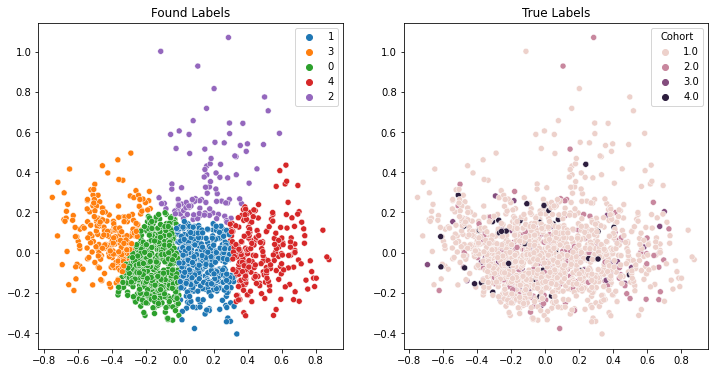

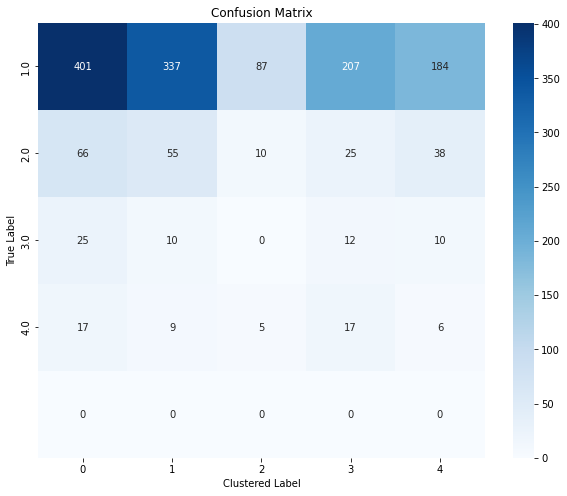

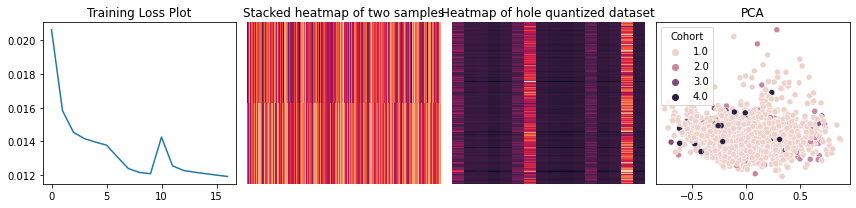

 57%|█████▋    | 17/30 [57:01<1:37:47, 451.35s/it]

HOPKINS STATISTIC 0.9333981406330404


 57%|█████▋    | 17/30 [1:07:45<51:48, 239.15s/it]


KeyboardInterrupt: 

In [8]:
best_performing_config = {'variational': False, 'convolution': True, 'transformer': False, 'dropout': 0.3, 'latent_dim': 16, 'padding': 2, 'kernel_size': 5}
data_param = '../workfiles/PPMI_genes.pkl'

e = experiment.Experiment(data_param, best_performing_config, verbose = 2, n_epoch = 30)
e.run()